# Exploratory Data Analysis (EDA)

# [**\*\*Open in NBViewer to see Interactive Maps\*\***](https://nbviewer.jupyter.org/github/nathann3/airbnb_pricer_seattle/blob/master/notebooks/0_EDA.ipynb)

https://nbviewer.jupyter.org/github/nathann3/airbnb_pricer_seattle/blob/master/notebooks/0_EDA.ipynb

In this notebook we take a deep dive into the Airbnb listings data and try to uncover some hidden patterns or intresting findings that might relate to overall goal, to estimate yearly revenue prices.

# Imports

In [20]:
import folium
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import requests
import seaborn as sns

from branca.element import Template, MacroElement
from folium.plugins import HeatMap, TimestampedGeoJson
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm

sns.set_style("dark")

# Download data

In [21]:
def download_data(fp, url=None):
    if not url:
        url = 'http://data.insideairbnb.com/united-states/wa/seattle/2021-07-14/data/listings.csv.gz'
    r = requests.get(url, stream=True)
    block_size = 1024
    total_size = int(r.headers.get('content-length', 0))
    num_iterables = math.ceil(total_size / block_size)

    # Download if not already downloaded.
    if not os.path.exists(fp):
        dir, name = os.path.split(fp)
        if not os.path.exists(dir):
            os.makedirs(dir)
        with open(fp, "wb") as file:
            for data in tqdm(
                r.iter_content(block_size), total=num_iterables, unit="KB", unit_scale=True
            ):
                file.write(data)

In [22]:
fp = os.path.join('..', 'data', 'listings.csv.gz')
download_data(fp)

In [23]:
raw_listings = pd.read_csv(fp)
raw_listings.shape

(4096, 74)

In [24]:
raw_listings.sample(5, random_state=123)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
553,8290643,https://www.airbnb.com/rooms/8290643,20210714194849,2021-07-14,Private Fremont Studio with patio **Sanitized**,**UPDATE**. Studio is disinfected and linens w...,"Welcome to Fremont, ""The Center of the Univers...",https://a0.muscache.com/pictures/2d26f27f-c449...,35563669,https://www.airbnb.com/users/show/35563669,Priscilla,2015-06-11,"Seattle, Washington, United States",NaN,within an hour,100%,94%,t,https://a0.muscache.com/im/users/35563669/prof...,https://a0.muscache.com/im/users/35563669/prof...,Fremont,1,1,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,f,"Seattle, Washington, United States",Fremont,Other neighborhoods,47.65809,-122.35699,Entire guest suite,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Dedicated workspace"", ""Hangers"", ""Kitchen"", ...",$102.00,2,14,2,2,1125,1125,2.0,1125.0,NaN,t,6,6,6,6,2021-07-14,306,23,2,2016-07-15,2021-06-27,4.91,4.97,4.94,4.99,4.99,4.93,4.86,STR-OPLI-19-000258,f,2,2,0,0,5.03
3731,49949336,https://www.airbnb.com/rooms/49949336,20210714194849,2021-07-15,Charming Studio in Prime Location,"Getaway, remote work or temp living! Furnished...",NaN,https://a0.muscache.com/pictures/miso/Hosting-...,309771614,https://www.airbnb.com/users/show/309771614,Nespace,2019-11-15,US,NaN,within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/7054c...,https://a0.muscache.com/im/pictures/user/7054c...,Wallingford,49,49,"['email', 'phone', 'offline_government_id', 's...",t,t,NaN,University District,University District,47.66316,-122.30458,Entire apartment,Entire home/apt,1,NaN,1 bath,NaN,1.0,"[""Dedicated workspace"", ""Kitchen"", ""Private en...",$60.00,30,1125,30,30,1125,1125,30.0,1125.0,NaN,t,7,37,37,112,2021-07-15,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,37,37,0,0,NaN
3241,48394342,https://www.airbnb.com/rooms/48394342,20210714194849,2021-07-14,1Br & 1 Bathroom Condo in Historic Building Do...,Save during our 4th July sale. You’ll get an e...,"The building is historical and quirky, full of...",https://a0.muscache.com/pictures/867b70ff-78c3...,359627667,https://www.airbnb.com/users/show/359627667,Seth,2020-07-31,US,NaN,within an hour,99%,99%,f,https://a0.muscache.com/im/pictures/user/13281...,https://a0.muscache.com/im/pictures/user/13281...,Downtown Seattle,23,23,"['email', 'phone', 'offline_government_id', 's...",t,t,"Seattle, Washington, United States",First Hill,Downtown,47.61012,-122.32580,Entire apartment,Entire home/apt,3,NaN,1 bath,1.0,1.0,"[""Dedicated workspace"", ""Luggage dropoff allow...",$235.00,30,365,30,30,1125,1125,30.0,1125.0,NaN,t,0,0,0,194,2021-07-14,2,2,0,2021-04-08,2021-04-11,3.00,3.50,3.50,3.00,3.00,4.00,3.00,Exempt,t,1,1,0,0,0.61
2334,38130168,https://www.

# Drop useless features

Looking at some features, off the bat we notice that we can drop some columns because they don't inherently contain useful information to use in our data exploration and analysis: ```listing_url```, ```scrape_id```, ```last_scraped```, ```picture_url```, ```host_thumbnail_url```, and ```calendar_last_scraped```.

Lastly, we notice that ```has_availability``` has only 1 unique value.

We will go ahead and drop these, as we are very certain that these features provide little to information to us.

In [25]:
def print_all(df):
    """Displays all rows of DataFrame"""
    pd.set_option('display.max_rows', None)
    display(df)
    pd.set_option('display.max_rows', 10)

print_all(raw_listings.nunique())

id                                              4096
listing_url                                     4096
scrape_id                                          1
last_scraped                                       2
name                                            3967
description                                     3663
neighborhood_overview                           2337
picture_url                                     4014
host_id                                         2204
host_url                                        2204
host_name                                       1297
host_since                                      1567
host_location                                    129
host_about                                      1556
host_response_time                                 4
host_response_rate                                43
host_acceptance_rate                              70
host_is_superhost                                  2
host_thumbnail_url                            

In [26]:
drop_listings = raw_listings.drop(['listing_url', 'scrape_id', 'last_scraped',
                                   'picture_url', 'host_thumbnail_url',
                                   'calendar_last_scraped', 'has_availability'], axis=1)

# Missing Values


Next we look at the missing values.


```neighborhood```, ```neighborhood_overview``` and ```host_about``` has almost a quarter of missing data, mainly because they are optional fields. neighbourhood can be assessed from the location of the listing and thus we can ignore and drop it.

```host_response_time``` and ```host_response_rate``` have the same number of missing values. Maybe due to not having a guest book thier listing yet. host_acceptance_rate also have missing data probably for the same reason.

```host_neighborhood``` is also optional which explains the 300 missing values.

```bathrooms``` is all missing, but we can use ```bathroom_text``` so we can drop this feature. We can also drop ```calendar_updated```.

```bedrooms``` and ```beds``` are missing because some are studios and sometimes listers forget to put that information. We can extract the type of listing from the listing's title can input studios as 0.

```review``` features all have similar amounts of missing data. This might be because these are new listings and they do not have any reviews yet. We sould look at the ```number_of_reviews``` feature to confirm.

```license``` has a quarter of missing values, probably because most people do not have a license.


In [27]:
missing_vals = raw_listings.isnull().sum()
print_all(missing_vals[missing_vals != 0])

description                       9
neighborhood_overview          1198
host_location                     7
host_about                      984
host_response_time              436
host_response_rate              436
host_acceptance_rate            376
host_neighbourhood              317
neighbourhood                  1198
bathrooms                      4096
bathrooms_text                    2
bedrooms                        618
beds                             92
calendar_updated               4096
first_review                    763
last_review                     763
review_scores_rating            763
review_scores_accuracy          768
review_scores_cleanliness       768
review_scores_checkin           768
review_scores_communication     768
review_scores_location          768
review_scores_value             768
license                        1119
reviews_per_month               763
dtype: int64

In [28]:
# drop columns that are redundant and/or contain no information
drop_listings = drop_listings.drop(['neighbourhood', 'bathrooms', 'calendar_updated'], axis=1)

# Numerical variables

We separate the categorcal data from the numerical. We also take out text data like the name and the description of the listing.


Nominal categorical variables: ```host_location```, ```host_response_time```, ```host_is_superhost```, ```host_has_profile_pic```, ```host_identity_verified```, ```neighbourhood_cleansed```, ```neighbourhood_group_cleansed```, ```property_type```, ```room_type```, ```instant_bookable```.


Text variables : ```name```, ```description```, ```neighborhood_overview```, ```host_name```, ```host_neighbourhood```, ```amenities```, ```license```

Numeric variables: ```host_total_listings_count```, ```latitude```, ```longitude```, ```accommodates```, ```bathrooms_text```, ```bedrooms```, ```beds```, ```price```, ```minimum_nights```, ```maximum_nights```, ```minimum_minimum_nights```, ```maximum_minimum_nights```, ```minimum_maximum_nights```, ```maximum_maximum_nights```, ```minimum_nights_avg_ntm```, ```maximum_nights_avg_ntm```,  ```availability_30```, ```availability_60```, ```availability_90```, ```availability_365```, ```number_of_reviews```, ```review_scores_rating```, ```review_scores_accuracy```, ```review_scores_cleanliness```, ```review_scores_checkin```, ```review_scores_communication```, ```review_scores_location```, ```review_scores_value```, ```calculated_host_listings_count```, ```calculated_host_listings_count_entire_homes```,  ```calculated_host_listings_count_private_rooms```,  ```calculated_host_listings_count_shared_rooms```,```reviews_per_month```

In [29]:
cat_cols = ['host_location', 'host_response_time', 'host_is_superhost',
 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed', 'property_type', 'room_type', 'instant_bookable']

text_cols = ['name', 'description', 'neighborhood_overview', 'host_name',
             'host_neighbourhood', 'amenities', 'license']

num_cols = ['host_total_listings_count', 'latitude', 'longitude',
            'accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'price',
            'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
            'maximum_minimum_nights', 'minimum_maximum_nights',
            'maximum_maximum_nights', 'minimum_nights_avg_ntm',
            'maximum_nights_avg_ntm', 'availability_30', 'availability_60',
            'availability_90', 'availability_365', 'number_of_reviews',
            'review_scores_rating', 'review_scores_accuracy',
            'review_scores_cleanliness', 'review_scores_checkin',
            'review_scores_communication', 'review_scores_location',
            'review_scores_value', 'calculated_host_listings_count',
            'calculated_host_listings_count_entire_homes',
            'calculated_host_listings_count_private_rooms',
            'calculated_host_listings_count_shared_rooms', 'reviews_per_month']

In [30]:
drop_listings[num_cols].head()

,host_total_listings_count,latitude,longitude,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2,47.61094,-122.29286,9,2.5 baths,4.0,4.0,$475.00,30,1125,12,30,1125,1125,29.5,1125.0,6,13,13,238,32,5.00,5.00,5.00,5.00,5.00,5.00,4.84,2,2,0,0,0.58
1,5,47.65444,-122.33629,2,1 bath,1.0,1.0,$102.00,2,1125,2,2,1125,1125,2.0,1125.0,2,9,28,87,153,4.60,4.67,4.67,4.82,4.75,4.87,4.55,1,1,0,0,2.45
2,9,47.55017,-122.31937,2,3 shared baths,1.0,2.0,$75.00,2,180,2,2,180,180,2.0,180.0,4,4,4,275,149,4.66,4.74,4.71,4.92,4.88,4.64,4.61,9,0,9,0,1.12
3,0,47.55495,-122.38663,4,1 bath,2.0,3.0,$165.00,5,1125,3,5,1125,1125,5.0,1125.0,2,13,14,276,45,4.96,4.98,4.96,4.98,4.93,4.98,4.86,2,2,0,0,0.52
4,0,47.55627,-122.38607,3,1 bath,2.0,2.0,$125.00,5,1125,5,5,1125,1125,5.0,1125.0,0,11,36,311,58,4.98,4.98,4.98,5.00,4.98,4.95,4.93,2,2,0,0,0.58


We notice ```bathrooms_text``` and ```price``` are text so we convert them to numeric.

In [31]:
 drop_listings['price'] = drop_listings['price'].replace('[\$,]', '', regex=True).astype(float)

 drop_listings['bathrooms_text'] = drop_listings['bathrooms_text'].replace(['Shared half-bath', 'Half-bath', 'Private half-bath'],'0.5 baths').fillna('0')
 drop_listings['bathrooms_text'] = [''.join(re.findall('\d*\.?\d+', item)) for item in drop_listings['bathrooms_text']]
 drop_listings['bathrooms_text'] = drop_listings['bathrooms_text'].astype(float)

50% of hosts have 2 listings or less, while 75% have 11 lists or less. There is a host that has over 2,000 listings!

On average listings accomodate 3.75 people, but the average number of beds is 1.95. 75% of listings are 2 bedrooms or less.

Prices range from just \$19 a day to \$3750 a day, the median price being \$135.

The most common minimum number of nights to book is surprisingly 30, with 2 and then 1 following. This might signal a rise in short term rentals and sublets.

On average, a listing has 180 days available in the year, meaning about half of the year has already been booked. Looking at availability 30, 60 and 90, we can see that Airbnbs most commonly have only 0-5 days vaccant in the future, demonstrating high demand for Airbnbs.

For number of reviews, we see a wide range starting from 0 reviews to 1018 reviews. 50% of listings only have 20 reviews or lower and 75% listings have 85 reviews or lower. The average listing will get about 3 reviews a month, with the top 99% of listings recieving more than 20 reviews a month.

We also see that an overwhelmingly amount of positively rated listings. 75% of all listings are greater than 4.5, with the average total rating for a listings being 4.746.

In [33]:
drop_listings[num_cols].describe()

,host_total_listings_count,latitude,longitude,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,3478.000000,4004.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,4096.000000,3333.000000,3328.000000,3328.000000,3328.000000,3328.000000,3328.000000,3328.000000,4096.000000,4096.000000,4096.000000,4096.000000,3333.000000
mean,114.835693,47.625174,-122.332325,3.751465,1.294556,1.623634,1.956793,179.378418,14.885742,577.734863,15.004395,37.181152,816.126221,839.646484,36.009033,829.075098,5.883789,18.774414,37.200195,180.388916,62.466064,4.745650,4.815652,4.776232,4.883963,4.869910,4.853083,4.711079,18.050293,16.286133,1.446289,0.317871,3.079898
std,384.554808,0.047338,0.032607,2.412573,0.648633,0.978094,1.490542,155.687177,19.041248,521.901719,27.150959,125.870550,479.048178,465.045214,122.060690,468.948866,8.376965,17.533234,25.843201,115.638914,95.671382,0.435459,0.358916,0.394164,0.285321,0.333019,0.243593,0.386668,34.940094,34.457727,5.085020,2.601124,4.809680
min,0.000000,47.496790,-122.419050,1.000000,0.000000,1.000000,0.000000,19.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.000000,47.603400,-122.353572,2.000000,1.000000,1.000000,1.000000,91.000000,2.000000,32.000000,2.000000,2.000000,365.000000,365.000000,2.000000,365.000000,0.000000,4.000000,15.000000,74.000000,2.000000,4.710000,4.800000,4.750000,4.890000,4.890000,4.820000,4.670000,1.000000,1.000000,0.000000,0.000000,0.740000
50%,2.000000,47.620628,-122.330290,3.000000,1.000000,1.000000,2.000000,135.000000,3.000000,365.000000,3.000000,4.000000,1125.000000,1125.000000,3.000000,1125.000000,2.000000,14.000000,35.000000,161.000000,20.000000,4.870000,4.920000,4.900000,4.960000,4.970000,4.920000,4.810000,2.000000,1.000000,0.000000,0.000000,1.990000
75%,11.000000,47.662222,-122.308768,4.000000,1.000000,2.000000,2.000000,216.000000,30.000000,1125.000000,30.000000,30.000000,1125.000000,1125.000000,30.000000,1125.000000,8.000000,29.000000,55.000000,296.000000,85.000000,4.960000,4.980000,4.980000,5.000000,5.000000,4.980000,4.900000,10.000000,6.000000,0.000000,0.000000,3.910000
max,2232.000000,47.734010,-122.241490,16.000000,16.000000,8.000000,19.000000,3750.000000,365.000000,10000.000000,730.000000,730.000000,10000.000000,10000.000000,730.000000,10000.000000,30.000000,60.000000,90.000000,365.000000,1018.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,128.000000,128.000000,32.000000,23.000000,127.270000


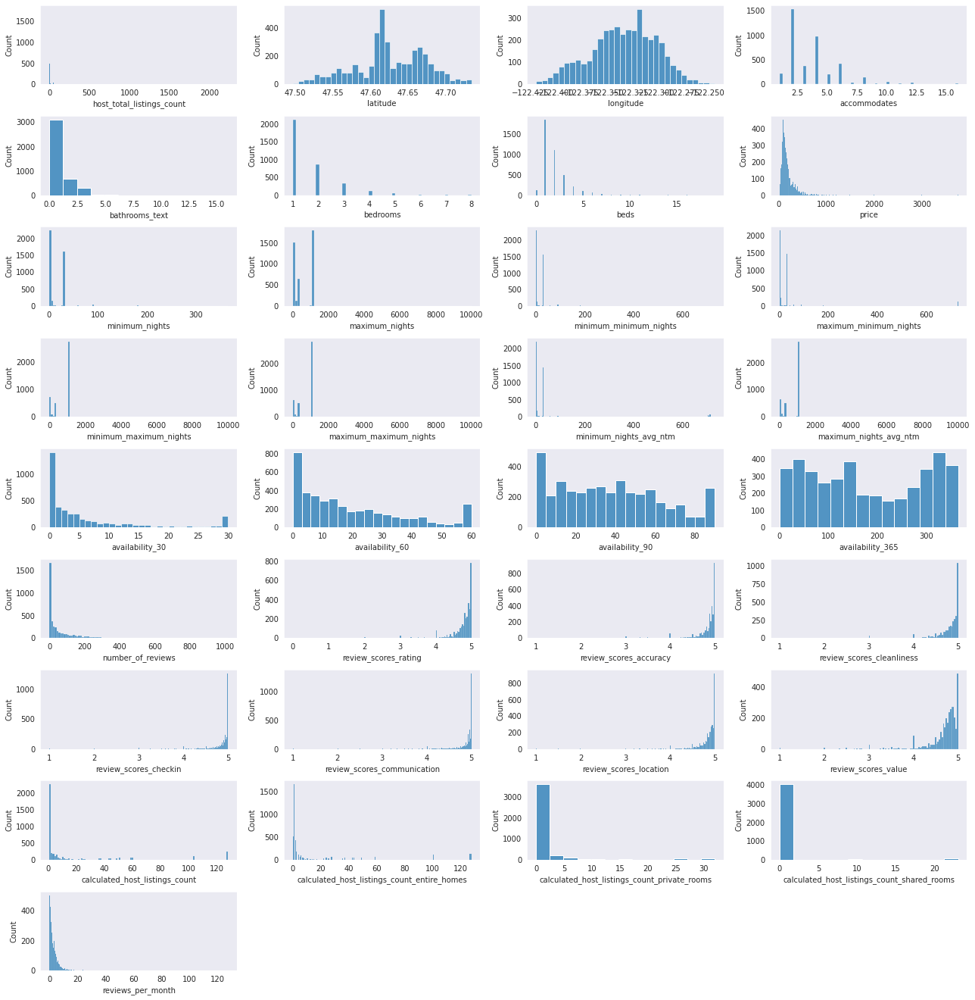

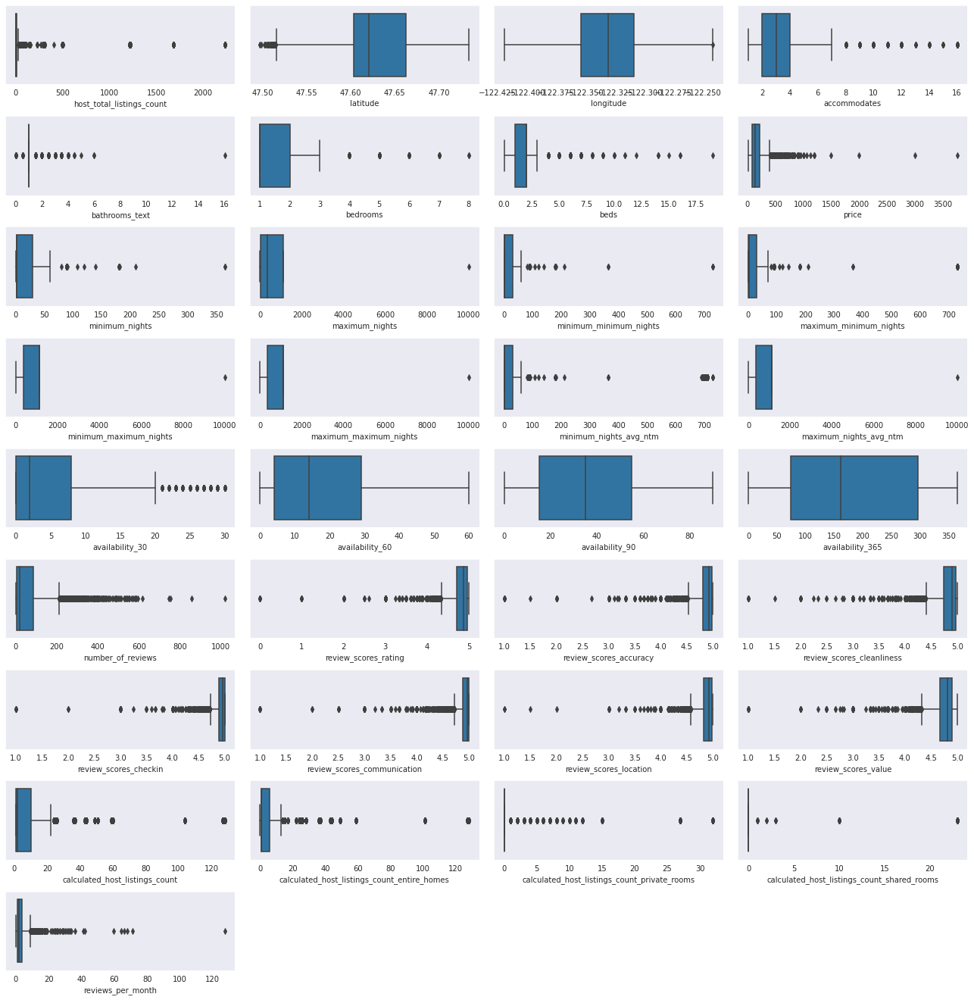

In [34]:
# histograms
fig = plt.figure(figsize=(18, 20))
for index, col in enumerate(drop_listings[num_cols]):
    plt.subplot(10, 4,index+1)
    sns.histplot(drop_listings.loc[:, col], kde=False)
fig.tight_layout(pad=1.0)

# boxplots
fig = plt.figure(figsize=(18, 20))
for index, col in enumerate(drop_listings[num_cols]):
    plt.subplot(10, 4,index+1)
    sns.boxplot(x=drop_listings.loc[:, col])
fig.tight_layout(pad=1.0)

In [ ]:
drop_listings['reviews_per_month'].quantile(.99)

17.801199999999945

Other than Other neighbourhoods, Downtown has the most listings, followed by Capitol Hill, a neighbourhood directly adjcent to Downtown.

In [35]:
drop_listings.iloc[0, 0]

2318

# Categorical variables.


All but 8 hosts have profile pics. About 40% of hosts are super hosts. The status doesn't seem too special with this in mind. And more than 75% of hosts have their identity verified. Lastly, most hosts respond to a potential booking within a single hour.

Other than Other neighbourhoods, Downtown has the most listings, followed by Capitol Hill, a neighbourhood directly adjcent to Downtown.

The most common listing type is an entire home or apartment, and the least common is a shared room. Listings are almost 50/50 split for being instantly bookable. For half the hosts, approving the renter is important for they are inviting over stangers and damages can be costly to a rental business.



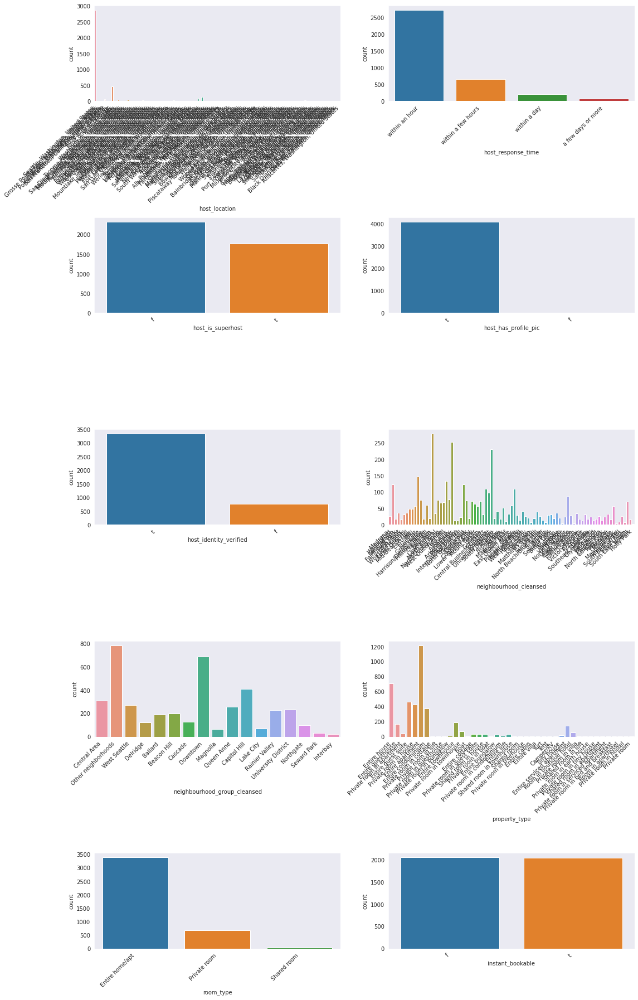

In [36]:
# countplots
fig = plt.figure(figsize=(16, 25))
for index, col in enumerate(drop_listings[cat_cols]):
    plt.subplot(5, 2, index+1)
    count = sns.countplot(x=drop_listings.loc[:, col])
    count.set_xticklabels(count.get_xticklabels(), rotation=45, horizontalalignment='right')
fig.tight_layout(pad=1.0)

# Maps

We next plot maps to better visualize our geospatial data

## All Airbnb listings

In [37]:
# Plot all Airbnb listings
m = folium.Map(location=[47.61807, -122.42945],
               zoom_start=11,
               min_zoom=11,
)

for i in range(len(drop_listings)):
    folium.CircleMarker(
        location=[drop_listings.iloc[i]['latitude'], drop_listings.iloc[i]['longitude']],
        tooltip = str([drop_listings.iloc[i]['latitude'], drop_listings.iloc[i]['longitude']]),
        radius=5,
        color='#00A699',
        fill_color='#FF5A5F',
        fill_opacity=0.8,
        opacity=0.5,
        weight=1,
   ).add_to(m)

m

## Airbnb listings through time (2010-2021)

We can use first_review as an estimate for the number of Airbnbs throughout the year.

Reviews start from April 25, 2010 to July 14, 2021.

Since all the listings scraped are active today, we will use a cumulative line chart to approximate Airbnb growth in Seattle. The line chart should end with the amount of reviews in the data.

In [39]:
# Convert to datetime.
drop_listings.first_review = pd.to_datetime(drop_listings.first_review)

# Date range.
print('Earliest review:', drop_listings.first_review.min())
print('Latest review:', drop_listings.first_review.max())

Earliest review: 2010-04-25 00:00:00
Latest review: 2021-07-14 00:00:00


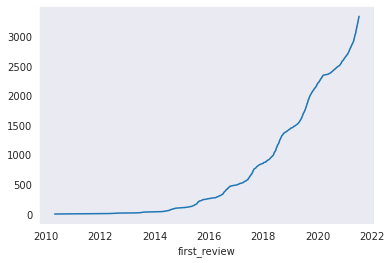

In [40]:
# Cumulative hist of listings through time.
x = drop_listings.first_review.sort_values()
y = np.cumsum(np.full(len(drop_listings.first_review), 1))
sns.lineplot(x=x, y=y)
plt.show()

In [41]:
# Map neighborhoods to colors.
palette = sns.color_palette('muted', drop_listings.neighbourhood_group_cleansed.nunique()).as_hex()
cmap = {neighbourhood: color for neighbourhood, color in zip(drop_listings.neighbourhood_group_cleansed.unique(), palette)}

# Manually set colors for better distinction.
cmap['Lake City'], cmap['Central Area'] = cmap['Central Area'], cmap['Lake City']

In [43]:
# Prepare geoson data features.
listings_time = drop_listings[['latitude', 'longitude', 'first_review']].dropna()

features = []
for _, row in listings_time.iterrows():
    feature = {
        'type': 'Feature',
        'geometry': {
            'type':'Point', 
            'coordinates':[row['longitude'],row['latitude']]
        },
        'properties': {
            'time': pd.to_datetime(row['first_review']).__str__(),
            'style': {'color': '#00A699', 'opacity': 0.2},
            'icon': 'circle',
            'iconstyle':{
                'fillColor': '#FF5A5F',
                'fillOpacity': 0.4,
                'stroke': 'true',
                'radius': 3,
                'weight': 1,
            }
        }
    }
    features.append(feature)

In [44]:
# Map of listings through time.
time_map = folium.Map(location=[47.61807, -122.42945], tiles='cartodbpositron', zoom_start=11, min_zoom=11)

TimestampedGeoJson(features,
                  period = 'P2Y',
                  transition_time = 500,
                  auto_play = True).add_to(time_map)

time_map

## Airbnb listings by neighborhood

Zooming in on the map you can see that Downtown has the highest density of Airbnb listings, followed by Capitol Hill

In [47]:
# Plot listings by neighborhood.
m = folium.Map(location=[47.61807, -122.42945],
               tiles='cartodbpositron',
               zoom_start=11,
               min_zoom=11)

for i in range(len(drop_listings)):
    folium.CircleMarker(
        location=[drop_listings.iloc[i]['latitude'], drop_listings.iloc[i]['longitude']],
        radius=3,
        color='#000000', # '#808080',
        fill_color=cmap[drop_listings.iloc[i]['neighbourhood_group_cleansed']],
        fill_opacity=0.8,
        weight=1,
   ).add_to(m)

In [48]:
# Add legend.
template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Neighbourhoods</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#956cb4;opacity:1;'></span>Ballard</li>
    <li><span style='background:#8c613c;opacity:1;'></span>Beacon Hill</li>
    <li><span style='background:#4878d0;opacity:1;'></span>Capitol Hill</li>
    <li><span style='background:#dc7ec0;opacity:1;'></span>Cascade</li>
    <li><span style='background:#ee854a;opacity:1;'></span>Central Area</li>
    <li><span style='background:#d65f5f;opacity:1;'></span>Delridge</li>
    <li><span style='background:#797979;opacity:1;'></span>Downtown</li>
    <li><span style='background:#dc7ec0;opacity:1;'></span>Interbay</li>
    <li><span style='background:#4878d0;opacity:1;'></span>Lake City</li>
    <li><span style='background:#d5bb67;opacity:1;'></span>Magnolia</li>
    <li><span style='background:#956cb4;opacity:1;'></span>Northgate</li>
    <li><span style='background:#ee854a;opacity:1;'></span>Other neighborhoods</li>
    <li><span style='background:#82c6e2;opacity:1;'></span>Queen Anne</li>
    <li><span style='background:#6acc64;opacity:1;'></span>Rainier Valley</li>
    <li><span style='background:#8c613c;opacity:1;'></span>Seward Park</li>
    <li><span style='background:#d65f5f;opacity:1;'></span>University District</li>
    <li><span style='background:#6acc64;opacity:1;'></span>West Seattle</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

## Price heatmap

The most expensive Airbnbs are located downtown.

On average Downtown has the most expensive Airbnbs with an average price per night of \$227.75, followed by Queen Anne and Beacon Hill, which have an average price per night of \$226.035 and \$207.89 respectively.

In [80]:
hmap = folium.Map(location=[47.61807, -122.42945], tiles='cartodbpositron', zoom_start=11, min_zoom=11)
max_amount = float(drop_listings.price.max())

hm_wide = HeatMap(list(zip(drop_listings.latitude.values, drop_listings.longitude.values, drop_listings.price.values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=6, blur=5, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  


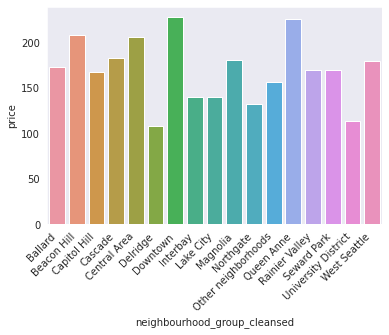

In [54]:
neighbourhood_prices = drop_listings.groupby('neighbourhood_group_cleansed')[['price']].mean().reset_index()
fig = sns.barplot(x='neighbourhood_group_cleansed', y='price', data=neighbourhood_prices)
fig.set_xticklabels(fig.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Here we can see that Airbnb availability is more spread out / less variable throughout the neighbourhoods than the prices. Downtown has the 3rd highest availability in the future year demonstrating how though Downtown Seattle listings are the most expensive, they also have the highest vacancy, probably due to having the most Airbnbs out of all the neighborhoods.

One fact we have to consider is that maybe hosts don't list their Airbnbs year round, and only in the summer, which might expalin why downtown has the most availability; because these are most likely units that were bought or rented out for the entire purpose of Airbnb.

In [97]:
hmap = folium.Map(location=[47.61807, -122.42945], tiles='cartodbpositron', zoom_start=11, min_zoom=11)
max_amount = float(drop_listings.price.max())

availability = drop_listings.availability_90.astype(float)

hm_wide = HeatMap(list(zip(drop_listings.latitude.values, drop_listings.longitude.values, availability)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=6,
                  blur=5, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  # This is added back by InteractiveShellApp.init_path()


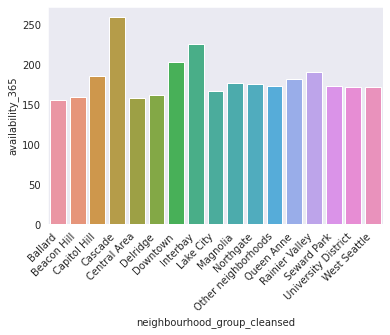

In [62]:
neighbourhood_availability = drop_listings.groupby('neighbourhood_group_cleansed')[['availability_365']].mean().reset_index()
fig = sns.barplot(x='neighbourhood_group_cleansed', y='availability_365', data=neighbourhood_availability)
fig.set_xticklabels(fig.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

# Calendar

Prices are highest in June and on Saturdays. If you are planning a vacation to Seattle, I would recommend you going in the Winter on a Tuesday if you are looking for the best deal.

In June, the average price of an Airbnb is 200, while in January it is only 165.

Though Tuesday is the cheapest day, the avergae price is only about $10 less than on Saturday, so I would recommend not to keep days of the week in mind, but focus on the month of the year.


In [71]:
fp = os.path.join('..', 'data', 'calendar.csv.gz')
download_data(fp, url='http://data.insideairbnb.com/united-states/wa/seattle/2021-07-14/data/calendar.csv.gz')

100%|██████████| 4.67k/4.67k [00:00<00:00, 29.9kKB/s]


In [78]:
calendar = pd.read_csv(fp, compression='gzip', parse_dates=['date'])
calendar.sample(5, random_state=123)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
974230,42994085,2022-06-23,t,$177.00,$177.00,30.0,1125.0
865206,38645782,2022-03-25,t,$149.00,$149.00,2.0,1125.0
49030,2620429,2021-12-01,f,$197.00,$177.00,3.0,12.0
849339,36202177,2022-02-19,f,$130.00,$130.00,1.0,28.0
128989,6813846,2021-12-05,f,$184.00,$184.00,2.0,1125.0


In [73]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1495043 entries, 0 to 1495042
Data columns (total 7 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   listing_id      1495043 non-null  int64         
 1   date            1495043 non-null  datetime64[ns]
 2   available       1495043 non-null  object        
 3   price           1495043 non-null  object        
 4   adjusted_price  1495043 non-null  object        
 5   minimum_nights  1495042 non-null  float64       
 6   maximum_nights  1495042 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 79.8+ MB


In [74]:
calendar.price = calendar.price.replace('[\$,]', '', regex=True).astype(float)

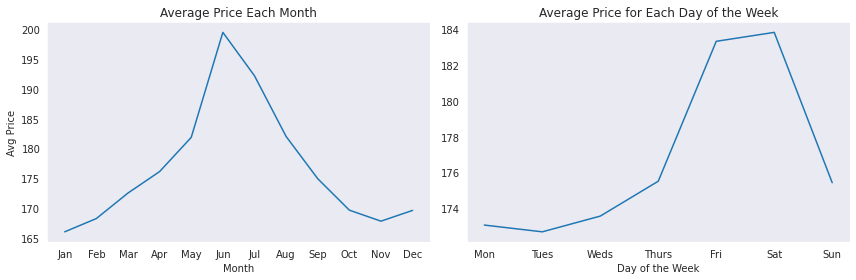

In [75]:
# groupby
by_month = calendar.groupby(calendar["date"].dt.month).mean()
by_dotw = calendar.groupby(calendar["date"].dt.dayofweek).mean()

# map
days = {0: "Mon", 1: "Tues", 2: "Weds", 3: "Thurs", 4: "Fri", 5: "Sat", 6: "Sun"}
months = {
    1: "Jan",
    2: "Feb",
    3: "Mar",
    4: "Apr",
    5: "May",
    6: "Jun",
    7: "Jul",
    8: "Aug",
    9: "Sep",
    10: "Oct",
    11: "Nov",
    12: "Dec",
}

# plot
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.title("Average Price Each Month")
plt.plot(by_month.index.map(months), by_month.price)
plt.xlabel("Month")
plt.ylabel("Avg Price")

plt.subplot(1, 2, 2)
plt.title("Average Price for Each Day of the Week")
plt.plot(by_dotw.index.map(days), by_dotw.price)
plt.xlabel("Day of the Week")
plt.tight_layout()

plt.show()